# Use case: Sales prediction

## Table of Contents
1 : Business Understanding  
2 : Analytic Approach  
3 : Data Requirements  
4 : Data Collection  
5 : Data Understanding  
6 : Data Preparation  
7 : Modeling  
8 : Evaluation  

## 1. Business Understanding  
**Problem:**  To manage stock reserves, we need sales prediction.  
**Question:** Can we predict sales per item per point of sales?  

## 2. Analytic Approach
Modeling: Regression model.   
Evaluation:   

## 3. Data reguirements:
Source: Internal data  
Format: csv  
Content:  
- items,   
- items categories,  
- shops,  
- sales.  

## 4. Data collecion

In [1]:
#libraries

# computation
import numpy as np
import pandas as pd
import itertools

# visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# statistic
from pylab import rcParams
import statsmodels.api as sm

# machine learning
from xgboost import XGBRegressor
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler

pd.set_option('display.float_format', lambda x: '%.2f' % x)
import warnings
warnings.filterwarnings("ignore")

print('Imported')

Imported


In [2]:
# loading data

items = pd.read_csv(r'.\202004SalesPrediction.data\items.csv',  dtype={
    'item_name': 'str', 
    'item_id': 'int32', 
    'item_category_id': 'int32'
    }
    )
item_categories = pd.read_csv(r'.\202004SalesPrediction.data\item_categories.csv', dtype={
    'item_category_name': 'str', 
    'item_category_id': 'int32'
    }
    )
shops = pd.read_csv(r'.\202004SalesPrediction.data\shops.csv', dtype={
    'shop_name': 'str', 
    'shop_id': 'int32'
    }
    )
test = pd.read_csv(r'.\202004SalesPrediction.data\test.csv', dtype={
    'ID': 'int32', 
    'shop_id': 'int32', 
    'item_id': 'int32'
    }
    )
print('Loaded')

Loaded


In [3]:
sales = pd.read_csv(r'.\202004SalesPrediction.data\sales_train.csv', parse_dates=['date'], dtype={
    'date': 'str', 
    'date_block_num': 'int32', 
    'shop_id': 'int32', 
    'item_id': 'int32', 
    'item_price': 'float32', 
    'item_cnt_day': 'int32'
    }
    )
print('Loaded')

Loaded


In [4]:
# join datasets

train = sales.join(items, on='item_id', rsuffix='_').join(shops, on='shop_id', rsuffix='_').join(item_categories, on='item_category_id', rsuffix='_').drop(['item_id_', 'shop_id_', 'item_category_id_'], axis=1)

train.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,shop_name,item_category_name
0,2013-02-01,0,59,22154,999.00,1,ЯВЛЕНИЕ 2012 (BD),37,"Ярославль ТЦ ""Альтаир""",Кино - Blu-Ray
1,2013-03-01,0,25,2552,899.00,1,DEEP PURPLE The House Of Blue Light LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
2,2013-05-01,0,25,2552,899.00,-1,DEEP PURPLE The House Of Blue Light LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
3,2013-06-01,0,25,2554,1709.05,1,DEEP PURPLE Who Do You Think We Are LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
4,2013-01-15,0,25,2555,1099.00,1,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),56,"Москва ТРК ""Атриум""",Музыка - CD фирменного производства


## 5. Data understanding

In [55]:
print(train.shape)

(2935849, 10)


In [57]:
train.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,shop_name,item_category_name
0,2013-02-01,0,59,22154,999.00,1,ЯВЛЕНИЕ 2012 (BD),37,"Ярославль ТЦ ""Альтаир""",Кино - Blu-Ray
1,2013-03-01,0,25,2552,899.00,1,DEEP PURPLE The House Of Blue Light LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
2,2013-05-01,0,25,2552,899.00,-1,DEEP PURPLE The House Of Blue Light LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
3,2013-06-01,0,25,2554,1709.05,1,DEEP PURPLE Who Do You Think We Are LP,58,"Москва ТРК ""Атриум""",Музыка - Винил
4,2013-01-15,0,25,2555,1099.00,1,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),56,"Москва ТРК ""Атриум""",Музыка - CD фирменного производства


In [58]:
train.describe()

,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_category_id
count,2935849.00,2935849.00,2935849.00,2935849.00,2935849.00,2935849.00
mean,14.57,33.00,10197.23,890.85,1.24,40.00
std,9.42,16.23,6324.30,1729.80,2.62,17.10
min,0.00,0.00,0.00,-1.00,-22.00,0.00
25%,7.00,22.00,4476.00,249.00,1.00,28.00
50%,14.00,31.00,9343.00,399.00,1.00,40.00
75%,23.00,47.00,15684.00,999.00,1.00,55.00
max,33.00,59.00,22169.00,307980.00,2169.00,83.00


## Stage 6 : Data Preparation

In [5]:
# Data leakages
# I'll be using only the "shop_id" and "item_id" that appear on the test set.

test_shop_ids = test['shop_id'].unique()
lk_train = train[train['shop_id'].isin(test_shop_ids)] # Only shops that exist in test set.

test_item_ids = test['item_id'].unique()
lk_train = lk_train[lk_train['item_id'].isin(test_item_ids)] # Only items that exist in test set.

print(
'Data set size before leaking:', train.shape[0], 
'Data set size after leaking:', lk_train.shape[0]
)

Data set size before leaking: 2935849 Data set size after leaking: 1224439


In [6]:
# Drop item_price < 0
train = train.loc[train.item_price > 0]
train.shape

(2935848, 10)

In [7]:
# Drop some columns
train_monthly = lk_train[['date', 'date_block_num', 'shop_id', 'item_category_id', 'item_id', 'item_price', 'item_cnt_day']]

In [8]:
# Drop dublicates

#train_monthly.duplicated().sum()
train_monthly.drop_duplicates(inplace=True)

In [9]:
# Group by month (date_block_num = month)

train_monthly = train_monthly.groupby(['date_block_num', 'shop_id', 'item_category_id', 'item_id'], as_index=False).agg(
{
        'item_price':['sum', 'mean'], 
        'item_cnt_day':['sum', 'mean','count']
}
)

# Rename columns
train_monthly.columns = ['date_block_num', 'shop_id', 'item_category_id', 'item_id', 'item_price', 'mean_item_price', 'item_cnt', 'mean_item_cnt', 'transactions']

In [10]:
# Extract year and months

train_monthly['year'] = train_monthly['date_block_num'].apply(lambda x: ((x//12) + 2013))
train_monthly['month'] = train_monthly['date_block_num'].apply(lambda x: (x % 12))

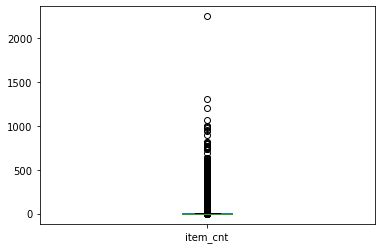

In [14]:
# Checking outliers
train_monthly.item_cnt.plot.box()
plt.show()

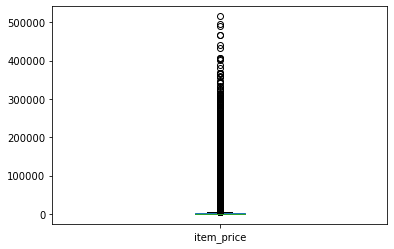

In [15]:
train_monthly.item_price.plot.box()
plt.show()

In [11]:
train_monthly = train_monthly.loc[(train_monthly.item_cnt >= 0)]

In [12]:
train_monthly = train_monthly.loc[(train_monthly.item_cnt <= 40)]

In [13]:
train_monthly = train_monthly.loc[(train_monthly.item_price < 400000)]

In [14]:
# Creatibf a label = "item_cnt" of the next month, as we are dealing with a forecast problem

train_monthly['label'] = train_monthly.sort_values('date_block_num').groupby(['shop_id', 'item_id'])['item_cnt'].shift(-1)

** Features engeneering**

In [15]:
 # Unitary item prices
train_monthly['item_price_unit'] = train_monthly['item_price'] // train_monthly['item_cnt']
train_monthly['item_price_unit'].fillna(0, inplace=True)

In [16]:
from numpy import inf
train_monthly['item_price_unit'].replace(np.inf, 0, inplace=True) # removing inf

In [17]:
# historical min max price for each item_id
gp_item_price = train_monthly.sort_values('date_block_num').groupby(['item_id'], as_index=False).agg({'item_price':[np.min, np.max]})
gp_item_price.columns = ['item_id', 'hist_min_item_price', 'hist_max_item_price']

train_monthly = pd.merge(train_monthly, gp_item_price, on='item_id', how='left')

In [18]:
# price change relative to historical min and max

train_monthly['price_increase'] = train_monthly['item_price'] - train_monthly['hist_min_item_price']
train_monthly['price_decrease'] = train_monthly['hist_max_item_price'] - train_monthly['item_price']

In [19]:
#Lag based features

lag_list = [1, 2, 3]

for lag in lag_list:
    ft_name = ('item_cnt_shifted%s' % lag)
    train_monthly[ft_name] = train_monthly.sort_values('date_block_num').groupby(['shop_id', 'item_category_id', 'item_id'])['item_cnt'].shift(lag)
    # Fill the empty shifted features with 0
    train_monthly[ft_name].fillna(0, inplace=True)

In [20]:
# Item sales count trend

train_monthly['item_trend'] = train_monthly['item_cnt']

for lag in lag_list:
    ft_name = ('item_cnt_shifted%s' % lag)
    train_monthly['item_trend'] -= train_monthly[ft_name]

train_monthly['item_trend'] /= len(lag_list) + 1

In [21]:
# Result

train_monthly.describe()

,date_block_num,shop_id,item_category_id,item_id,item_price,mean_item_price,item_cnt,mean_item_cnt,transactions,year,...,label,item_price_unit,hist_min_item_price,hist_max_item_price,price_increase,price_decrease,item_cnt_shifted1,item_cnt_shifted2,item_cnt_shifted3,item_trend
count,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,...,486123.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00
mean,20.17,32.07,42.48,10005.08,2037.28,909.33,2.25,1.07,1.97,2014.22,...,2.20,867.07,579.60,10283.72,1457.68,8246.44,1.99,1.77,1.58,-0.77
std,9.14,16.89,17.71,6183.53,6485.42,1557.28,3.08,0.37,1.97,0.77,...,2.79,1485.19,1236.24,19230.54,5776.02,15082.26,3.12,3.13,3.11,1.69
min,0.00,2.00,2.00,30.00,0.50,0.50,0.00,0.00,1.00,2013.00,...,0.00,0.00,0.50,45.00,0.00,0.00,0.00,0.00,0.00,-24.00
25%,13.00,19.00,30.00,4406.00,299.00,299.00,1.00,1.00,1.00,2014.00,...,1.00,249.00,150.00,1794.00,106.94,1197.00,1.00,0.00,0.00,-1.00
50%,22.00,31.00,40.00,9071.00,745.00,473.18,1.00,1.00,1.00,2014.00,...,1.00,449.00,291.00,4796.00,333.00,3596.00,1.00,1.00,1.00,-0.50
75%,28.00,47.00,55.00,15323.00,1799.00,1099.00,2.00,1.00,2.00,2015.00,...,2.00,999.00,660.89,11109.86,1086.00,8993.50,2.00,2.00,2.00,0.00
max,33.00,59.00,83.00,22167.00,367840.00,42990.00,40.00,36.00,26.00,2015.00,...,40.00,94970.00,35991.00,367840.00,349849.00,349849.00,40.00,40.00,40.00,10.00


In [22]:
train_monthly.describe()

,date_block_num,shop_id,item_category_id,item_id,item_price,mean_item_price,item_cnt,mean_item_cnt,transactions,year,...,label,item_price_unit,hist_min_item_price,hist_max_item_price,price_increase,price_decrease,item_cnt_shifted1,item_cnt_shifted2,item_cnt_shifted3,item_trend
count,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,...,486123.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00,597502.00
mean,20.17,32.07,42.48,10005.08,2037.28,909.33,2.25,1.07,1.97,2014.22,...,2.20,867.07,579.60,10283.72,1457.68,8246.44,1.99,1.77,1.58,-0.77
std,9.14,16.89,17.71,6183.53,6485.42,1557.28,3.08,0.37,1.97,0.77,...,2.79,1485.19,1236.24,19230.54,5776.02,15082.26,3.12,3.13,3.11,1.69
min,0.00,2.00,2.00,30.00,0.50,0.50,0.00,0.00,1.00,2013.00,...,0.00,0.00,0.50,45.00,0.00,0.00,0.00,0.00,0.00,-24.00
25%,13.00,19.00,30.00,4406.00,299.00,299.00,1.00,1.00,1.00,2014.00,...,1.00,249.00,150.00,1794.00,106.94,1197.00,1.00,0.00,0.00,-1.00
50%,22.00,31.00,40.00,9071.00,745.00,473.18,1.00,1.00,1.00,2014.00,...,1.00,449.00,291.00,4796.00,333.00,3596.00,1.00,1.00,1.00,-0.50
75%,28.00,47.00,55.00,15323.00,1799.00,1099.00,2.00,1.00,2.00,2015.00,...,2.00,999.00,660.89,11109.86,1086.00,8993.50,2.00,2.00,2.00,0.00
max,33.00,59.00,83.00,22167.00,367840.00,42990.00,40.00,36.00,26.00,2015.00,...,40.00,94970.00,35991.00,367840.00,349849.00,349849.00,40.00,40.00,40.00,10.00


### Train/validation split

In [23]:
# test (a separate file) == 33 date_bloc_num, then validation - last 5 blocks, others - train 
train_set = train_monthly.loc[train_monthly.date_block_num < 28].copy()
validation_set = train_monthly.loc[(train_monthly.date_block_num >=28) & (train_monthly.date_block_num != 33)]
test_set = train_monthly.loc[train_monthly.date_block_num == 33].copy()

In [24]:
# dropping label
train_set.dropna(subset=['label'], inplace=True)
validation_set.dropna(subset=['label'], inplace=True)

# dropping missing values
train_set.dropna(inplace=True)
validation_set.dropna(inplace=True)

In [25]:
print(
'Train set records:', train_set.shape[0], '\n',
'Validation set records:', validation_set.shape[0], '\n',
'Test set records:', test_set.shape[0],
)

Train set records: 403037 
 Validation set records: 83086 
 Test set records: 28609


In [26]:
# Mean encoding

# shop mean
gp_shop_mean = train_set.groupby(['shop_id']).agg({'label': ['mean']})
gp_shop_mean.columns = ['shop_mean']
gp_shop_mean.reset_index(inplace=True)

In [27]:
# item mean
gp_item_mean = train_set.groupby(['item_id']).agg({'label': ['mean']})
gp_item_mean.columns = ['item_mean']
gp_item_mean.reset_index(inplace=True)

In [28]:
# shop with item mean 
gp_shop_item_mean = train_set.groupby(['shop_id', 'item_id']).agg({'label': ['mean']})
gp_shop_item_mean.columns = ['shop_item_mean']
gp_shop_item_mean.reset_index(inplace=True)

In [29]:
# year mean 
gp_year_mean = train_set.groupby(['year']).agg({'label': ['mean']})
gp_year_mean.columns = ['year_mean']
gp_year_mean.reset_index(inplace=True)

In [30]:
# month mean 
gp_month_mean = train_set.groupby(['month']).agg({'label': ['mean']})
gp_month_mean.columns = ['month_mean']
gp_month_mean.reset_index(inplace=True)

In [31]:
# Add mean features to train set
train_set = pd.merge(train_set, gp_shop_mean, on=['shop_id'], how='left')
train_set = pd.merge(train_set, gp_item_mean, on=['item_id'], how='left')
train_set = pd.merge(train_set, gp_shop_item_mean, on=['shop_id', 'item_id'], how='left')
train_set = pd.merge(train_set, gp_year_mean, on=['year'], how='left')
train_set = pd.merge(train_set, gp_month_mean, on=['month'], how='left')
train_set.head()

,date_block_num,shop_id,item_category_id,item_id,item_price,mean_item_price,item_cnt,mean_item_cnt,transactions,year,...,price_decrease,item_cnt_shifted1,item_cnt_shifted2,item_cnt_shifted3,item_trend,shop_mean,item_mean,shop_item_mean,year_mean,month_mean
0,0,2,2,5572,10730.00,1532.86,9,1.29,7,2013,...,8249.50,0.00,0.00,0.00,2.25,2.12,2.26,1.47,2.38,2.17
1,0,2,2,5643,4775.21,2387.60,0,0.00,2,2013,...,30484.79,0.00,0.00,0.00,0.00,2.12,2.73,2.42,2.38,2.17
2,0,2,5,5583,1188.30,594.15,2,1.00,2,2013,...,4403.70,0.00,0.00,0.00,0.50,2.12,1.66,1.33,2.38,2.17
3,0,2,6,7893,5970.00,1990.00,3,1.00,3,2013,...,36660.00,0.00,0.00,0.00,0.75,2.12,4.10,3.46,2.38,2.17
4,0,2,6,7894,1490.00,1490.00,1,1.00,1,2013,...,29800.00,0.00,0.00,0.00,0.25,2.12,4.74,2.25,2.38,2.17


In [32]:
# Add mean features to validation set
validation_set = pd.merge(validation_set, gp_shop_mean, on=['shop_id'], how='left')
validation_set = pd.merge(validation_set, gp_item_mean, on=['item_id'], how='left')
validation_set = pd.merge(validation_set, gp_shop_item_mean, on=['shop_id', 'item_id'], how='left')
validation_set = pd.merge(validation_set, gp_year_mean, on=['year'], how='left')
validation_set = pd.merge(validation_set, gp_month_mean, on=['month'], how='left')

In [33]:
# Create train and validation sets and labels

X_train = train_set.drop(['label', 'date_block_num'], axis=1)
Y_train = train_set['label'].astype(int)

X_validation = validation_set.drop(['label', 'date_block_num'], axis=1)
Y_validation = validation_set['label'].astype(int)

In [34]:
# # Integer features (used by catboost model).
# int_features = ['shop_id', 'item_id', 'year', 'month']

# X_train[int_features] = X_train[int_features].astype('int32')
# X_validation[int_features] = X_validation[int_features].astype('int32')

### Build test set
we use block 33 to forecast values for block 34.

In [35]:
latest_records = pd.concat([train_set, validation_set]).drop_duplicates(subset=['shop_id', 'item_id'], keep='last')

In [36]:
X_test = pd.merge(test, latest_records, on=['shop_id', 'item_id'], how='left', suffixes=['', '_'])

In [37]:
X_test['year'] = 2015
X_test['month'] = 9
X_test.drop('label', axis=1, inplace=True)
X_test = X_test[X_train.columns]

In [38]:
X_test.head()

,shop_id,item_category_id,item_id,item_price,mean_item_price,item_cnt,mean_item_cnt,transactions,year,month,...,price_decrease,item_cnt_shifted1,item_cnt_shifted2,item_cnt_shifted3,item_trend,shop_mean,item_mean,shop_item_mean,year_mean,month_mean
0,5,19.00,5037,2997.50,999.17,3.00,1.00,3.00,2015,9,...,22992.50,1.00,1.00,1.00,0.00,1.85,2.54,1.50,1.91,2.07
1,5,nan,5320,nan,nan,nan,nan,nan,2015,9,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2,5,19.00,5233,2997.00,999.00,3.00,1.00,3.00,2015,9,...,4194.75,1.00,2.00,3.00,-0.75,1.85,3.43,nan,1.91,2.21
3,5,nan,5232,nan,nan,nan,nan,nan,2015,9,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
4,5,nan,5268,nan,nan,nan,nan,nan,2015,9,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [39]:
# Replacing missing values

sets = [X_train, X_validation, X_test]

In [40]:
# with the median of each shop.            
for dataset in sets:
    for shop_id in dataset['shop_id'].unique():
        for column in dataset.columns:
            shop_median = dataset[(dataset['shop_id'] == shop_id)][column].median()
            dataset.loc[(dataset[column].isnull()) & (dataset['shop_id'] == shop_id), column] = shop_median

In [41]:
X_test.fillna(X_test.mean(), inplace=True)

In [42]:
X_train.drop(['item_category_id'], axis=1, inplace=True)
X_validation.drop(['item_category_id'], axis=1, inplace=True)
X_test.drop(['item_category_id'], axis=1, inplace=True)

In [43]:
# Test set

In [44]:
X_test.head()

,shop_id,item_id,item_price,mean_item_price,item_cnt,mean_item_cnt,transactions,year,month,item_price_unit,...,price_decrease,item_cnt_shifted1,item_cnt_shifted2,item_cnt_shifted3,item_trend,shop_mean,item_mean,shop_item_mean,year_mean,month_mean
0,5.00,5037.00,2997.50,999.17,3.00,1.00,3.00,2015.00,9.00,999.00,...,22992.50,1.00,1.00,1.00,0.00,1.85,2.54,1.50,1.91,2.07
1,5.00,5320.00,499.00,399.00,1.00,1.00,1.00,2015.00,9.00,399.00,...,3488.00,1.00,1.00,0.00,-0.25,1.85,1.54,1.00,1.91,2.18
2,5.00,5233.00,2997.00,999.00,3.00,1.00,3.00,2015.00,9.00,999.00,...,4194.75,1.00,2.00,3.00,-0.75,1.85,3.43,1.00,1.91,2.21
3,5.00,5232.00,499.00,399.00,1.00,1.00,1.00,2015.00,9.00,399.00,...,3488.00,1.00,1.00,0.00,-0.25,1.85,1.54,1.00,1.91,2.18
4,5.00,5268.00,499.00,399.00,1.00,1.00,1.00,2015.00,9.00,399.00,...,3488.00,1.00,1.00,0.00,-0.25,1.85,1.54,1.00,1.91,2.18


### Modeling

In [45]:
### XGBoost


xgb_features = ['item_cnt', 'item_cnt_shifted1', 
                'item_cnt_shifted2', 'item_cnt_shifted3', 'shop_mean', 
                'shop_item_mean', 'item_trend', 'mean_item_cnt']

xgb_train = X_train[xgb_features]
xgb_val = X_validation[xgb_features]
xgb_test = X_test[xgb_features]

In [46]:
xgb_model = XGBRegressor(max_depth=8, 
                         n_estimators=500, 
                         min_child_weight=1000,  
                         colsample_bytree=0.7, 
                         subsample=0.7, 
                         eta=0.3, 
                         seed=0)
xgb_model.fit(xgb_train, 
              Y_train, 
              eval_metric="rmse", 
              eval_set=[(xgb_train, Y_train), (xgb_val, Y_validation)], 
              verbose=20, 
              early_stopping_rounds=20)

[0]	validation_0-rmse:2.85388	validation_1-rmse:2.41532
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 20 rounds.
[20]	validation_0-rmse:1.83013	validation_1-rmse:2.00217
Stopping. Best iteration:
[7]	validation_0-rmse:1.94373	validation_1-rmse:1.84855



XGBRegressor(base_score=0.5, booster=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, eta=0.3, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.300000012, max_delta_step=0, max_depth=8,
             min_child_weight=1000, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=0, subsample=0.7,
             tree_method=None, validate_parameters=False, verbosity=None)

In [48]:
xgb_train_pred = xgb_model.predict(xgb_train)
xgb_val_pred = xgb_model.predict(xgb_val)
xgb_test_pred = xgb_model.predict(xgb_test)

In [49]:
xgb_train_pred = xgb_train_pred.astype('int64')
xgb_val_pred = xgb_val_pred.astype('int64')
xgb_test_pred = xgb_test_pred.astype('int64')

In [50]:
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, xgb_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_validation, xgb_val_pred)))

Train rmse: 2.0303445385594356
Validation rmse: 1.903915619829907


In [80]:
def model_performance_sc_plot(predictions, labels):

    # Get min and max values of the predictions and labels.
    min_val = max(max(predictions), max(labels))
    max_val = min(min(predictions), min(labels))

    # Create dataframe with predicitons and labels.
    performance_df = pd.DataFrame({"Label":labels})
    performance_df["Prediction"] = predictions

    # # Plot data
    # sns.jointplot(y="Label", x="Prediction", data=performance_df, kind="reg", height=7)
    # plt.plot([min_val, max_val], [min_val, max_val], 'm--')
    # plt.title(title, fontsize=9)
    # plt.show()
    
    return performance_df

In [81]:
# model_performance_sc_plot(xgb_train_pred, Y_train)

result = model_performance_sc_plot(xgb_val_pred, Y_validation)
result

,Label,Prediction
0,1,1
1,1,1
2,1,1
3,1,1
4,1,2
...,...,...
83081,7,5
83082,13,10
83083,6,3
83084,2,3


 ### Random forest

In [67]:
# Use only part of features on random forest.
rf_features = ['shop_id', 'item_id', 'item_cnt', 'transactions', 'year',
               'item_cnt_shifted1', 'shop_mean', 'item_mean', 'item_trend', 'mean_item_cnt']
rf_train = X_train[rf_features]
rf_val = X_validation[rf_features]
rf_test = X_test[rf_features]

In [68]:
rf_model = RandomForestRegressor(n_estimators=50, max_depth=7, random_state=0, n_jobs=-1)
rf_model.fit(rf_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=7, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=50, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [69]:
rf_train_pred = rf_model.predict(rf_train)
rf_val_pred = rf_model.predict(rf_val)
rf_test_pred = rf_model.predict(rf_test)

In [70]:
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, rf_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_validation, rf_val_pred)))

Train rmse: 1.9562427185298399
Validation rmse: 1.8502297184481986


### Liear regression

In [72]:
lr_features = ['item_cnt', 'item_cnt_shifted1', 'item_trend', 'mean_item_cnt', 'shop_mean']
lr_train = X_train[lr_features]
lr_val = X_validation[lr_features]
lr_test = X_test[lr_features]

In [73]:
lr_scaler = MinMaxScaler()
lr_scaler.fit(lr_train)
lr_train = lr_scaler.transform(lr_train)
lr_val = lr_scaler.transform(lr_val)
lr_test = lr_scaler.transform(lr_test)

In [74]:
lr_model = LinearRegression(n_jobs=-1)
lr_model.fit(lr_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=False)

In [75]:
lr_train_pred = lr_model.predict(lr_train)
lr_val_pred = lr_model.predict(lr_val)
lr_test_pred = lr_model.predict(lr_test)

In [76]:
print('Train rmse:', np.sqrt(mean_squared_error(Y_train, lr_train_pred)))
print('Validation rmse:', np.sqrt(mean_squared_error(Y_validation, lr_val_pred)))

Train rmse: 2.1530828011790266
Validation rmse: 1.8459348813872796


## Conclusion:
Best performance - Ranom forest model

In [124]:
# Resulting prediction

rf_result = model_performance_sc_plot(rf_val_pred, Y_validation)
rf_result['Prediction'] = rf_result['Prediction'].astype('int') 

lr_result = model_performance_sc_plot(lr_val_pred, Y_validation)
lr_result['Prediction'] = lr_result['Prediction'].astype('int') 

xgb_result = model_performance_sc_plot(xgb_val_pred, Y_validation)
xgb_result['Prediction'] = xgb_result['Prediction'].astype('int') 

In [125]:
# merging

result_prediction = pd.merge(rf_result, lr_result, left_index=True, right_index=True)
result_prediction.drop(['Label_y'], axis = 1, inplace=True)
result_prediction.columns = ['label', 'rf_prediction', 'lr_prediction']

In [126]:
result_prediction = pd.merge(result_prediction, xgb_result, left_index=True, right_index=True)
result_prediction.drop(['Label'], axis = 1, inplace=True)
result_prediction.columns = ['label', 'rf_prediction', 'lr_prediction', 'xgboost_prediction']
result_prediction

,label,rf_prediction,lr_prediction,xgboost_prediction
0,1,1,1,1
1,1,2,1,1
2,1,1,1,1
3,1,1,1,1
4,1,1,1,2
...,...,...,...,...
83081,7,4,3,5
83082,13,11,9,10
83083,6,2,2,3
83084,2,2,2,3
